### Mobile Price Classification

### Context 
Bob has started his own mobile company. He wants to give tough fight to big companies like Apple,Samsung etc. He does not know how to estimate price of mobiles his company creates. In this competitive mobile phone market you cannot simply assume things. To solve this problem he collects sales data of mobile phones of various companies.

Bob wants to find out some relation between features of a mobile phone(eg:- RAM,Internal Memory etc) and its selling price. But he is not so good at Machine Learning. So he needs your help to solve this problem.

In this problem you do not have to predict actual price but a price range indicating how high the price is

### Attribute Information:
Total energy a battery can store in one time measured in mAh

blue - Has bluetooth or not

clock_speed - speed at which microprocessor executes instructions

dual_sim - Has dual sim support or not

fc - Front Camera mega pixels

four_g - Has 4G or not

int_memory - Internal Memory in Gigabytes

m_dep - Mobile Depth in cm

mobile_wt - Weight of mobile phone

n_cores - Number of cores of processor

pc - Primary Camera mega pixels

px_height - Pixel Resolution Height

px_width - Pixel Resolution Width

ram - Random Access Memory in Mega Bytes

sc_h - Screen Height of mobile in cm

sc_w - Screen Width of mobile in cm

talk_time - longest time that a single battery charge will last when you are

three_g - Has 3G or not

touch_screen - Has touch screen or not

wifi - Has wifi or not

price_range - This is the target variable with value of 0(low cost), 1(medium cost), 2(high cost) and 3(very high cost).

### Import Libraries

In [2]:
#numerical Libraries
import numpy as np

#to handle data in the form of row and columns
import pandas as pd

#importing plotting libraries
import matplotlib.pyplot as plt

#importing seaborn libraries for statistical plotting
import seaborn as sns
sns.set_style('darkgrid')

#Exploratory data analysis
from pandas_profiling import ProfileReport

#import error warning
import warnings
warnings.filterwarnings('ignore')

#Chart Studio provides a web-service for hosting graphs
import chart_studio.plotly as py

#graphing library which facilitates interactive plotting
import cufflinks as cf
cf.go_offline()

import plotly.express as px
from plotly.offline import download_plotlyjs, iplot, init_notebook_mode, plot

init_notebook_mode(connected=True)

import plotly.graph_objs as go

#Prediction libraries
from sklearn.preprocessing import scale
from sklearn.feature_selection import SelectKBest,chi2
from sklearn.model_selection import ShuffleSplit, GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score
from sklearn import model_selection

#Feature Selection
from sklearn.ensemble import ExtraTreesClassifier

from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import BaggingRegressor
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPRegressor
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LinearRegression
from sklearn.cross_decomposition import PLSRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import Lasso
from sklearn.linear_model import LassoCV
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import ElasticNetCV
from sklearn import linear_model
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.ensemble import GradientBoostingRegressor, GradientBoostingClassifier
# import xgboost as xgb
# from xgboost import XGBRegressor, XGBClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn import tree
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, roc_auc_score, roc_curve
from sklearn.cluster import KMeans

from sklearn.model_selection import StratifiedKFold
# Import Libraries for the ROC curve
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, roc_auc_score, roc_curve

#For web application
import pickle

### Load the dataset

In [3]:
df = pd.read_csv('train.csv')

__To view the first five rows of the dataset use head() function__

In [4]:
#Display top 5 rows of the dataframe df
df.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


## Data Analysis and Data Cleaning

__To view the column list in the dataset use the function dataframe.columns__

In [4]:
#List the column names in the dataset
df.columns

Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')

__Info method:__ This method prints information about a DataFrame including the index dtype and columns, non-null values and memory usage. To know more about the details [__click here__](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.info.html)

In [5]:
#to know the details of the columns, their data type
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

__Describe():__ Descriptive statistics include those that summarize the central tendency, dispersion and shape of a dataset’s distribution, excluding NaN values.

>For numeric data, the result’s index will include count, mean, std, min, max as well as lower, 50 and upper percentiles. By default the lower percentile is 25 and the upper percentile is 75. The 50 percentile is the same as the median.

>For object data (e.g. strings or timestamps), the result’s index will include count, unique, top, and freq. The top is the most common value. The freq is the most common value’s frequency. Timestamps also include the first and last items.

In [6]:
# to know about the 5 point values of the dataframe data use describe function
df.describe().T

,count,mean,std,min,25%,50%,75%,max
battery_power,2000.0,1238.51850,439.418206,501.0,851.75,1226.0,1615.25,1998.0
blue,2000.0,0.49500,0.500100,0.0,0.00,0.0,1.00,1.0
clock_speed,2000.0,1.52225,0.816004,0.5,0.70,1.5,2.20,3.0
dual_sim,2000.0,0.50950,0.500035,0.0,0.00,1.0,1.00,1.0
fc,2000.0,4.30950,4.341444,0.0,1.00,3.0,7.00,19.0
four_g,2000.0,0.52150,0.499662,0.0,0.00,1.0,1.00,1.0
int_memory,2000.0,32.04650,18.145715,2.0,16.00,32.0,48.00,64.0
m_dep,2000.0,0.50175,0.288416,0.1,0.20,0.5,0.80,1.0
mobile_wt,2000.0,140.24900,35.399655,80.0,109.00,141.0,170.00,200.0
n_cores,2000.0,4.52050,2.287837,1.0,3.00,4.0,7.00,8.0


### __Dataframe profile__ report generates profile reports from a pandas DataFrame.

The pandas df.describe() function is great but a little basic for serious exploratory data analysis. pandas_profiling extends the pandas DataFrame with df.profile_report() for quick data analysis.

For each column the following statistics - if relevant for the column type - are presented in an interactive HTML report:

- __Type inference:__ detect the types of columns in a dataframe.
- __Essentials:__ type, unique values, missing values
- __Quantile statistics__ like minimum value, Q1, median, Q3, maximum, range, interquartile range
- __Descriptive statistics__ like mean, mode, standard deviation, sum, median absolute deviation, coefficient of variation, kurtosis, skewness
- __Most frequent values__
- __Histogram__
- __Correlations__ highlighting of highly correlated variables, Spearman, Pearson and Kendall matrices
- __Missing values__ matrix, count, heatmap and dendrogram of missing values
- __Text analysis__ learn about categories (Uppercase, Space), scripts (Latin, Cyrillic) and blocks (ASCII) of text data.
- __File and Image analysis__ extract file sizes, creation dates and dimensions and scan for truncated images or those containing EXIF information.

In [7]:
df.profile_report()

### Visualization and Data analysis

In [8]:
df['price_range'].unique()

array([1, 2, 3, 0], dtype=int64)

From the data we see the price range from 0 to 3. 0 is the lowest rating and 3 is the highest rating.

__Compare the price range with respect to ram__

Differentiate price in to the dataframe related to the price range

In [9]:
df_pr_0 = df[df.price_range == 0]
df_pr_1 = df[df.price_range == 1]
df_pr_2 = df[df.price_range == 2]
df_pr_3 = df[df.price_range == 3]

In [10]:
#Dataframe that has the data which has mobile price range of '0'
df_pr_0

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
7,1954,0,0.5,1,0,0,24,0.8,187,4,...,512,1149,700,16,3,5,1,1,1,0
8,1445,1,0.5,0,0,0,53,0.7,174,7,...,386,836,1099,17,1,20,1,0,0,0
9,509,1,0.6,1,2,1,9,0.1,93,5,...,1137,1224,513,19,10,12,1,0,0,0
14,1866,0,0.5,0,13,1,52,0.7,185,1,...,356,563,373,14,9,3,1,0,1,0
15,775,0,1.0,0,3,0,46,0.7,159,2,...,862,1864,568,17,15,11,1,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1987,618,1,1.0,0,9,1,13,0.1,80,4,...,591,724,1424,15,12,7,1,1,0,0
1990,1617,1,2.4,0,8,1,36,0.8,85,1,...,743,1426,296,5,3,7,1,0,0,0
1992,674,1,2.9,1,1,0,21,0.2,198,3,...,576,1809,1180,6,3,4,1,1,1,0
1995,794,1,0.5,1,0,1,2,0.8,106,6,...,1222,1890,668,13,4,19,1,1,0,0


### Battery Vs Ram Pricing Structure

Let's plot the scatter plot to view the Pricing structure based on Battery Vs Ram

In [11]:
#Trace1 provides the details of the RAM and Battery Power where the price range is 0
trace1 = go.Scatter(x = df_pr_0.ram, y=df_pr_0.battery_power, mode='markers')

#Trace provides the details of the RAM and Battery Power where the price range is 1
trace2 = go.Scatter(x = df_pr_1.ram, y=df_pr_1.battery_power, mode='markers')

#Trace3 provides the details of the RAM and Battery Power where the price range is 2
trace3 = go.Scatter(x = df_pr_2.ram, y=df_pr_2.battery_power, mode='markers')

#Trace4 provides the details of the RAM and Battery Power where the price range is 4
trace4 = go.Scatter(x = df_pr_3.ram, y=df_pr_3.battery_power, mode='markers')


data = [trace1, trace2, trace3, trace4]


iplot is interactive plot. Plotly takes Python code and makes beautiful looking JavaScript plots. They let you have a lot of control over how these plots look and they let you zoom, show information on hover and toggle data to be viewed on the chart. [Tutorial] ('https://plotly.com/python/ipython-notebook-tutorial/').
Here is a link to [Google’s](https://www.google.com “Google’s Homepage”) home page.

In [12]:
layout = dict(title= " Battery and RAM - Price", xaxis= dict(title= 'Ram', ticklen= 5,zeroline= False),
              yaxis= dict(title= 'Battery Power',
                          ticklen= 5,zeroline= False),
             autosize=False,
             width=700,
             height=450,)

fig = dict(data = data, layout = layout)
iplot(fig)

### Let's look at how many phones have 3G support and how many phones have 4G support using pie chart

([<matplotlib.patches.Wedge at 0x18ec156a640>,
 [Text(-0.0742421550154638, 1.097491732278043, '4G supported'),
  Text(0.07424215501546366, -1.0974917322780433, '4G not supported')],
 [Text(-0.0404957209175257, 0.5986318539698416, '52.15'),
  Text(0.04049572091752563, -0.5986318539698418, '47.85')])

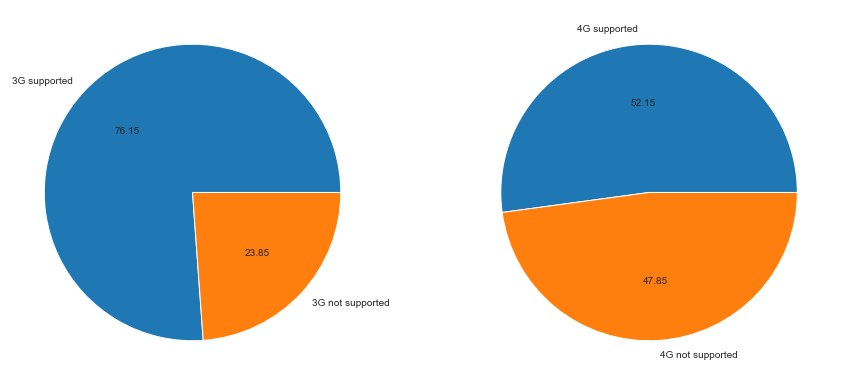

In [13]:
plt.figure(figsize=(15, 15))
ax1 = plt.subplot2grid((2, 2), (0, 0))
plt.pie(x=df['three_g'].value_counts(), autopct='%.2f', labels=['3G supported', '3G not supported'] )

ax1 = plt.subplot2grid((2, 2), (0, 1))
plt.pie(x=df['four_g'].value_counts(), autopct='%.2f', labels=['4G supported', '4G not supported'] )

### Will with increase in RAM does the Internal Memory Increase?

<Figure size 1296x1080 with 0 Axes>

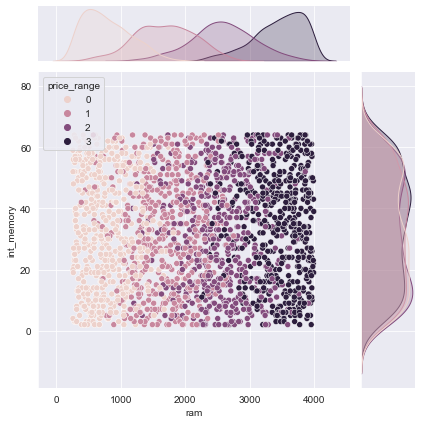

In [14]:
#Use joint plot to view the RAM Vs Internal Memory with respect to Price Range
plt.figure(figsize=(18,15))
sns.jointplot(x = df['ram'], y = df['int_memory'], data= df, hue=df['price_range'])
plt.show()

### Details of Mobile Battery

In [15]:
df[(df['battery_power'] <5) & (df['battery_power'] > 500)]

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range


In [16]:
df['battery_power'].min()

501

In [17]:
fig = px.histogram(x = 'battery_power',data_frame=df,  marginal = 'violin',
                  color_discrete_sequence = ['firebrick'])
fig.update_layout(xaxis_title_text = 'batter_power', yaxis_title_text= 'count', bargap=0.2, showlegend=True, )
iplot(fig)

## Ram count

In [18]:
fig = px.histogram(x = 'ram', data_frame = df,color='price_range', marginal='violin')

fig.update_layout(xaxis_title_text = 'Ram', yaxis_title_text='count', bargap=0.2)
iplot(fig)

### RAM vs Price Range box plot

In [19]:
df_pr_0 = df[df.price_range == 0]
df_pr_1 = df[df.price_range == 1]
df_pr_2 = df[df.price_range == 2]
df_pr_3 = df[df.price_range == 3]

In [20]:
df_pr_0 = df[df.price_range == 0]
df_pr_1 = df[df.price_range == 1]
df_pr_2 = df[df.price_range == 2]
df_pr_3 = df[df.price_range == 3]

trace0 = go.Box(
    y=df_pr_0.ram,
    name = 'Price Range: 0',
    marker = dict(
        color = 'rgb(223, 240, 0)',
    )
)
trace1 = go.Box(
    y=df_pr_1.ram,
    name = 'Price Range: 1',
    marker = dict(
        color = 'rgb(10, 110, 220)',
    )
)
trace2 = go.Box(
    y=df_pr_2.ram,
    name = 'Price Range: 2',
    marker = dict(
        color = 'rgb(242, 54, 14)',
    )
)
trace3 = go.Box(
    y=df_pr_3.ram,
    name = 'Price Range: 3',
    marker = dict(
        color = 'rgb(60, 200, 135)',
    )
)

data = [trace0, trace1, trace2, trace3]

layout = dict(title = 'Ram - Price Range',
              xaxis= dict(title= 'Price Range',
                          ticklen= 5,zeroline= False),
              yaxis= dict(title= 'Ram',
                          ticklen= 5,zeroline= False),
             autosize=False,
             width=700,
             height=450)

fig = dict(data = data, layout = layout)

iplot(fig)

### Battery Power Vs Price Range

In [21]:
df_pr_0 = df[df.price_range == 0]
df_pr_1 = df[df.price_range == 1]
df_pr_2 = df[df.price_range == 2]
df_pr_3 = df[df.price_range == 3]

In [22]:
trace0 = go.Box(y = df_pr_0.battery_power, name='battery 0', marker = dict(color ='rgb(223, 240, 0)'))
trace1 = go.Box(y = df_pr_1.battery_power, name='battery 1', marker = dict(color ='rgb(10, 240, 0)'))
trace2 = go.Box(y = df_pr_2.battery_power, name='battery 2', marker=dict(color =  'rgb(223, 40, 0)'))
trace3 = go.Box(y = df_pr_3.battery_power, name='battery 3', marker = {'color':  'rgb(223, 20, 70)'})

data = [trace0, trace1, trace2, trace3]
layout = dict(title = 'Battery Power - Price Range',
              xaxis= dict(title= 'Price Range',
                          ticklen= 5,zeroline= False),
              yaxis= dict(title= 'Battery Power',
                          ticklen= 5,zeroline= False),
             autosize=False,
             width=700,
             height=450)
fig = dict(data=data, layout = layout)
iplot(fig)

### Phone Height Vs Price Range

In [23]:
fig = px.histogram(x = 'px_height', data_frame=df, color='price_range', title = 'Phone Height - Price Range')
fig.update_layout(xaxis_title_text = 'Phone Height', yaxis_title_text = 'count')
iplot(fig)

In [24]:
df[(df['px_height'] >= 150) & (df['px_height'] <= 199) & (df['price_range'] == 0)].count()

battery_power    36
blue             36
clock_speed      36
dual_sim         36
fc               36
four_g           36
int_memory       36
m_dep            36
mobile_wt        36
n_cores          36
pc               36
px_height        36
px_width         36
ram              36
sc_h             36
sc_w             36
talk_time        36
three_g          36
touch_screen     36
wifi             36
price_range      36
dtype: int64

In [25]:
fig = px.histogram(x='px_width', data_frame = df, color='price_range', title = 'Phone Width - Price')
fig.update_layout(xaxis_title_text='Phone Width', yaxis_title_text='Count')
iplot(fig)

<AxesSubplot:>

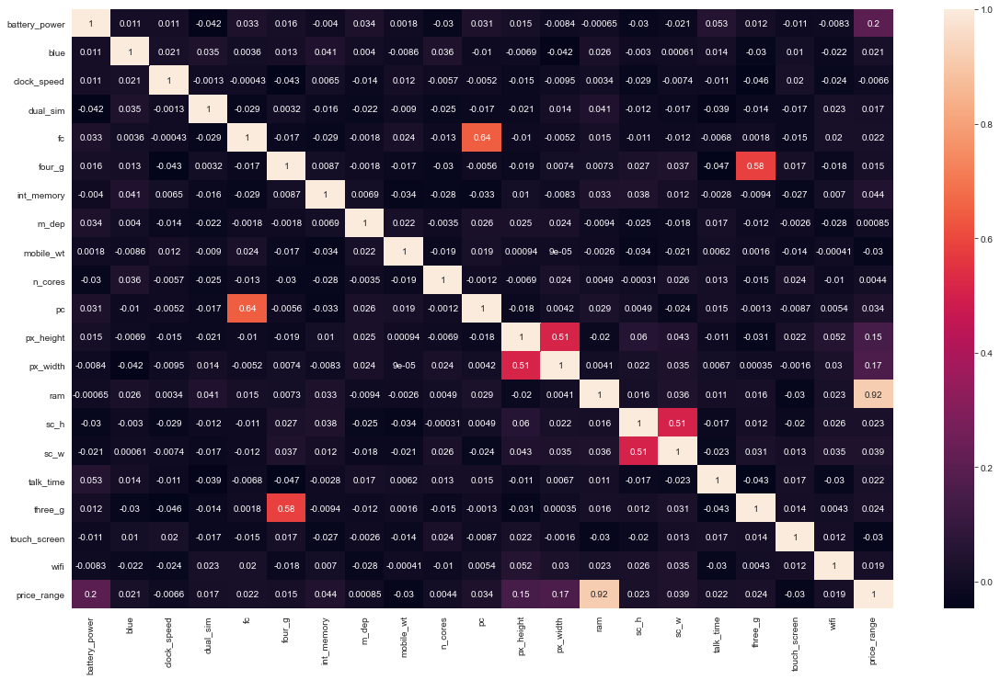

In [26]:
plt.gcf().set_size_inches(20, 12)
corr = df.corr()
sns.heatmap(corr, annot=True)

There is no correlation between any two variables. From the above corelation we see that there is high correlation between RAM and price range of the mobile. Higher the RAM higher the Price Range

### Univariate Feature Selection (X and y array)

In [5]:
#Differentiate the Feature to the target variables
X = df.iloc[:,0:20]

In [6]:
#Differentiate the Feature to the target variables
y = df.iloc[:,20:]

In [7]:
row_X, column_X = X.shape
row_y, column_y = y.shape
print('X has', row_X, 'rows and ', column_X, 'columns')
print('y has', row_y, 'rows and ', column_y, 'columns')

X has 2000 rows and  20 columns
y has 2000 rows and  1 columns


### Prediction

#### Splitting the data in to train and test data in the ratio of 80:20

In [8]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=333)

In [11]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
sc

StandardScaler()

In [12]:
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [13]:
best_fit = SelectKBest(chi2,k=10)
fit = best_fit.fit(X, y)

In [14]:
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)

In [15]:
# concat both dataframes for comparing best scores

score_list = pd.concat([dfcolumns,dfscores],axis=1)
score_list.columns = ["features","scores"]
score_list

,features,scores
0,battery_power,14129.866576
1,blue,0.723232
2,clock_speed,0.648366
3,dual_sim,0.631011
4,fc,10.135166
5,four_g,1.521572
6,int_memory,89.839124
7,m_dep,0.745820
8,mobile_wt,95.972863
9,n_cores,9.097556


In [16]:
print(score_list.nlargest(10,"scores"))

         features         scores
13            ram  931267.519053
11      px_height   17363.569536
0   battery_power   14129.866576
12       px_width    9810.586750
8       mobile_wt      95.972863
6      int_memory      89.839124
15           sc_w      16.480319
16      talk_time      13.236400
4              fc      10.135166
14           sc_h       9.614878


### Feature Importance Selection

In [17]:
feat_imp = ExtraTreesClassifier()
feat_imp.fit(X,y)
print(feat_imp.feature_importances_)

[0.06157403 0.01994561 0.03343952 0.01945703 0.03194292 0.01755551
 0.03463473 0.03341179 0.03544429 0.03256146 0.03302167 0.04676829
 0.04845921 0.39808435 0.03361057 0.03368901 0.03452178 0.01455071
 0.01803878 0.01928874]


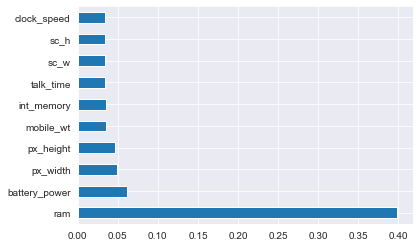

In [18]:
feat_importances = pd.Series(feat_imp.feature_importances_, index=X.columns)
feat_importances.nlargest(10).plot(kind='barh')
plt.show()

In [19]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

Selecting the top 10 best features and dropping the remaining columns

In [20]:
#Dropping columns like Bluetooth, Clock speed, Dual SIM, FourG, mobile depth, n_cores, PC, ThreeG, Touch Screen, Wifi
df.drop(df.columns[[1,2,3,5,7,9,10,17,18,19]],axis=1,inplace=True)

#### Separating dependent and independent variable

In [99]:
X = df.iloc[:,0:10].values
y = df.iloc[:,10:].values

In [100]:
X[0]

array([ 842,    1,    7,  188,   20,  756, 2549,    9,    7,   19],
      dtype=int64)

#### Applying cross validation technique on various models

>Randomforest Classifier

In [83]:
skfold = StratifiedKFold(n_splits=3,random_state=None)
model_c = RandomForestClassifier(criterion='entropy',n_estimators=10,random_state=0,n_jobs=-1)
results_skfold = model_selection.cross_val_score(model_c, X, y.ravel(), cv=skfold)
print("Accuracy: %.2f%%" % (results_skfold.mean()*100.0))

Accuracy: 87.75%


>KNN Classifier

In [85]:
skfold = StratifiedKFold(n_splits=3,random_state=None)
model_c = KNeighborsClassifier(n_neighbors=10)
results_skfold = model_selection.cross_val_score(model_c, X, y.ravel(), cv=skfold)
print("Accuracy: %.2f%%" % (results_skfold.mean()*100.0))

Accuracy: 92.60%


>Decision tree Classifier

In [86]:
skfold = StratifiedKFold(n_splits=3,random_state=None)
model_c = DecisionTreeClassifier()
results_skfold = model_selection.cross_val_score(model_c, X, y.ravel(), cv=skfold)
print("Accuracy: %.2f%%" % (results_skfold.mean()*100.0))

Accuracy: 81.90%


#### Fitting the Best model on train data

In [24]:
knn = KNeighborsClassifier(n_neighbors=10)
knn.fit(X,y)

KNeighborsClassifier(n_neighbors=10)

In [88]:
df[(df['fc'] > 5 ) & (df['fc'] <10)]

,battery_power,fc,int_memory,mobile_wt,px_height,px_width,ram,sc_h,sc_w,talk_time,price_range
13,803,7,17,198,344,1440,2680,7,1,4,2
17,595,7,23,121,441,810,3752,10,2,18,3
26,519,7,51,132,550,645,3763,16,1,4,3
37,1725,6,6,119,609,1307,3429,6,5,4,3
41,1646,8,41,185,1725,1932,3339,18,10,19,3
...,...,...,...,...,...,...,...,...,...,...,...
1981,1454,8,6,199,698,1018,1300,10,0,2,1
1985,1829,8,59,91,1457,1919,3142,16,6,5,3
1986,1139,6,58,161,742,999,1850,9,4,8,1
1987,618,9,13,80,591,724,1424,15,12,7,0


In [38]:
df[(df['ram'] <2000 ) & (df['ram'] > 1000)]

,battery_power,fc,int_memory,mobile_wt,px_height,px_width,ram,sc_h,sc_w,talk_time,price_range
4,1821,13,44,141,1208,1212,1411,8,2,15,1
5,1859,3,22,164,1004,1654,1067,17,1,10,1
8,1445,0,53,174,386,836,1099,17,1,20,0
12,1815,2,33,159,607,748,1482,18,0,2,1
18,1131,11,49,101,658,878,1835,19,13,16,1
...,...,...,...,...,...,...,...,...,...,...,...
1981,1454,8,6,199,698,1018,1300,10,0,2,1
1986,1139,6,58,161,742,999,1850,9,4,8,1
1987,618,9,13,80,591,724,1424,15,12,7,0
1988,1547,2,57,114,347,957,1620,9,2,19,1


In [98]:

knn.predict(([[1200, 16,15, 280, 1080, 1080, 2400, 5, 5, 12]]))

array([2], dtype=int64)

In [91]:
sc

StandardScaler()

### Deploy model into API form to extend the services

In [91]:
pickle.dump(knn,open('model.pkl','wb'))

In [58]:
import joblib
joblib.dump(sc,'Scaler.pkl')

['Scaler.pkl']

### Local Rest API with Flask predict
Create the prediction by selecting text file and save as "name.py" .
follow the process to call the funtion for the prediction.